In [2]:
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu, ttest_ind
import pandas_gbq
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import timedelta, date, datetime
from google.cloud import bigquery

%load_ext google.cloud.bigquery
# Set your default project here
pandas_gbq.context.project = 'wmt-edw-sandbox'
pandas_gbq.context.dialect = 'standard'

In [10]:
%%bigquery df
select *,
    EXTRACT(HOUR FROM SLOT_START_TS_UTC AT TIME ZONE (CLNT_PCKUP_FROM_TZ_CD)) as LOCAL_SLOT_HOUR,
    case when AT_PCKUP_TS <= PLAND_DRVR_PCKUP_TS then 1 else 0 end as on_tm_pckup_ind,
    row_number() over (partition by drvr_user_id, EXT_STORE_NBR order by ORDER_PLCD_TS_UTC) as drvr_store_seq_nbr,
    date_diff(SLOT_START_TS, DRVR_REASSGN_TS, minute) as tm_slot_start_driver_assgn,
    date_diff(ENRTE_TO_PCKUP_TS, DRVR_REASSGN_TS, minute) as tm_driver_assgn_enroute_to_store,
    date_diff(AT_PCKUP_TS, ENRTE_TO_PCKUP_TS, minute) as tm_drive_to_store,
    date_diff(AT_PCKUP_TS, DRVR_REASSGN_TS, minute) as tm_to_store,
    date_diff(ENRTE_TO_DROPOFF_TS, AT_PCKUP_TS, minute) as tm_at_store,
    date_diff(AT_DROPOFF_TS, ENRTE_TO_DROPOFF_TS, minute) as tm_to_customer_addr,
    date_diff(DLVR_CARRIER_TS, DRVR_REASSGN_TS, minute) as tot_lmd_time,
    date_diff(DLVR_CARRIER_TS, SLOT_START_TS, minute) as tm_dlvr_slot_start,
    date_diff(DLVR_CARRIER_TS, SLOT_END_TS, minute) as tm_dlvr_slot_end,
    date_diff(SLOT_END_TS, SLOT_START_TS, minute) as slot_time,
    case when date_diff(DLVR_CARRIER_TS, SLOT_START_TS, second) <= 3600 then 1 else 0 end as fast_sla_otd_ind,
    case when date_diff(DLVR_CARRIER_TS, SLOT_START_TS, second) <= 5400 then 1 else 0 end as slow_sla_otd_ind
from `wmt-edw-sandbox.LM_IAD_DAAS.DPS_DLMD_ALL`
where tenant_nm = 'Apple'
    and DLVR_CARRIER_TS is not null
    and RPT_DT between '2023-07-01' and '2023-10-31'

Downloading: 100%|████████████████████████████████████████████████████████████████████████| 74899/74899 [00:37<00:00, 1986.26rows/s]


In [22]:
df['tm_driver_search'] = (df['DRVR_REASSGN_TS'] - df['DLVR_OFFR_CRE_TS']).dt.total_seconds() / 60

## SLA Type
Apple has 2 differnt SLAs, almost all orders falls into 2 buckets: **60** minutes and **90** minutes.  
This is from slot start time to slot end time, show as **1hr** and **2hrs** in **SLA_Type** field in our data source.  
We see a clear OTD difference between 2 different SLA types.

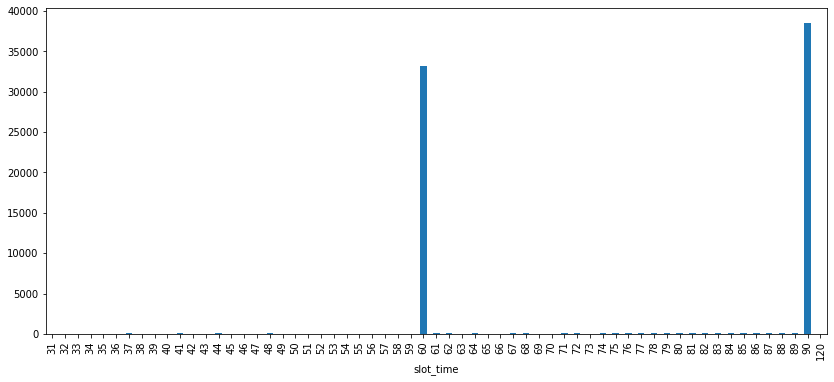

In [122]:
plt.figure(figsize=(14,6))
df.groupby('slot_time').DLVR_TASK_ID.nunique().plot(kind='bar');

In [6]:
def get_otd(df, by_cols, base_col='DAAS_ON_TM_DLVR_IND'):
    ''' Returns an OTD matrix by @by_cols, based on @base_col'''
    temp = df.groupby(by_cols + [base_col]).DLVR_TASK_ID.nunique().reset_index()
    temp['on_time_dlvr_cnt'] = temp[base_col] * temp['DLVR_TASK_ID']
    temp = temp.groupby(by_cols).sum().reset_index()
    temp.rename(columns={'DLVR_TASK_ID':'completed_deliveries'}, inplace=True)
    temp['OTD'] = temp['on_time_dlvr_cnt'] / temp['completed_deliveries']
    temp.drop(columns=[base_col], inplace=True)
    return temp

In [77]:
get_otd(df, ['SLA_Type'])

,SLA_Type,completed_deliveries,on_time_dlvr_cnt,OTD
0,1hr,34305,31468,0.917301
1,2hrs,40246,39213,0.974333


Diff SLA type performance in local hours (charts in tableau)  
**Findings**:
1. We get most orders at 10am, almost all of which are 90 mins slow window.
2. 2hr order decreases across the day, while 1hr order increases
3. OTD slightly decling during the day, both SLA type show same trend.

Diff SLA type performance in last mile time breakdowns:

In [367]:
time_cols = ['tm_slot_start_driver_assgn',
             'tm_driver_assgn_enroute_to_store',
            'tm_drive_to_store',
            'tm_at_store',
            'tm_to_customer_addr',
            'tot_lmd_time',
            'tm_dlvr_slot_start']

In [7]:
def compare_performance(df, by_cols, compare_cols):
    ''' Compare mean, median, 90% quantile of @by_cols and print out'''
    print('Mean:')
    df_mean = df.groupby(by_cols)[compare_cols].mean()
    display(df_mean)
    print("Median:")
    df_median = df.groupby(by_cols)[compare_cols].median()
    display(df_median)
    print("90% quantile:")
    df_p90 = df.groupby(by_cols)[compare_cols].quantile(0.9)
    display(df_p90)
    return df_mean, df_median, df_p90

In [368]:
compare_performance(df, ['SLA_Type'], time_cols)

Mean:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
SLA_Type,,,,,,,
1hr,-31.34250,17.519155,9.718153,6.779259,20.741313,58.37467,27.032170
2hrs,-28.56077,15.672038,10.034015,6.886081,18.938744,54.00235,25.477143


Median:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
SLA_Type,,,,,,,
1hr,-38.0,21.0,4.0,5.0,18.0,52.0,18
2hrs,-36.0,18.0,5.0,5.0,17.0,50.0,18


90% quantile:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
SLA_Type,,,,,,,
1hr,-10.0,30.0,26.0,12.0,30.0,78.0,53.0
2hrs,-7.0,29.0,26.0,12.0,28.0,75.0,53.0


90% deliveries delivered within 53 minutes after slot_start time

In [13]:
# distribution of times
def remove_outliers(df, col, iqr_bound=1.5):
    ''' Remove outliers with @iqr_bound * IQR.'''
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lowerbound = q1 - iqr_bound * iqr
    upperbound = q3 + iqr_bound * iqr
    return df[(df[col] >= lowerbound) & (df[col] <= upperbound)]
    
def plot_violins(df, by_col, plot_cols, iqr_bound=1.5):
    ''' 
    Plot violin plots for each column in @plot_cols, remove outilers with @iqr_bound * IQR.
    With x=@by_col, data from @df.
    '''
    # set up layout
    num_plots = len(plot_cols)
    num_cols = min(3, num_plots)
    num_rows = max(1, -(-num_plots // num_cols))
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    axes = axes.flatten()
    
    for i, plot_col in enumerate(plot_cols):
        ax = axes[i]
        # remove outliers
        df_filtered = remove_outliers(df, plot_col, iqr_bound)
        
        sns.violinplot(data=df_filtered, x=by_col, y=plot_col, ax=ax)
        ax.set_title(plot_col)
        
    plt.tight_layout()
    plt.show()

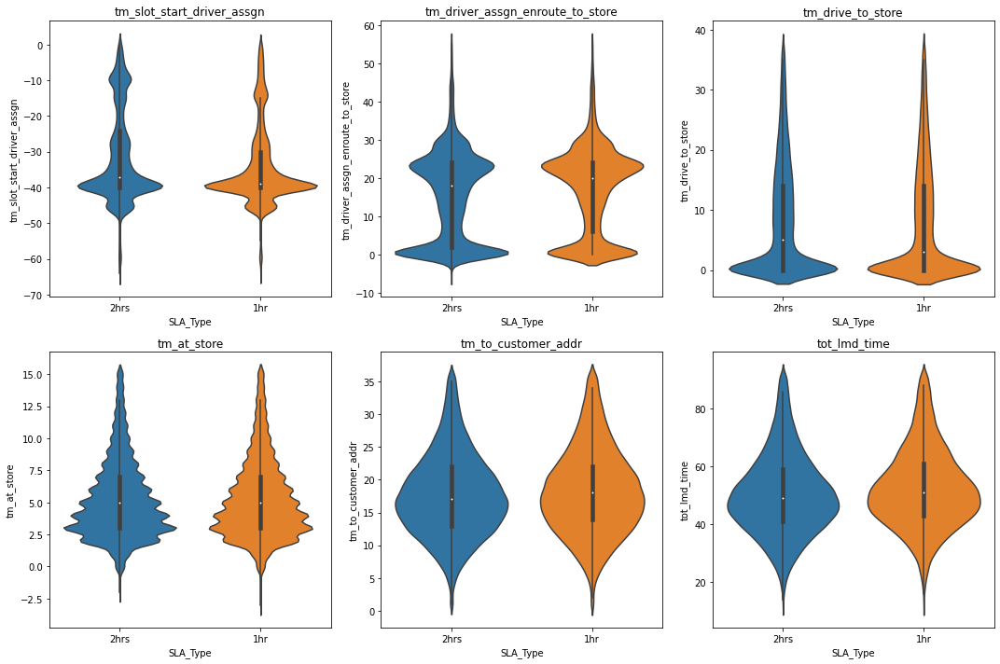

In [284]:
plot_violins(df, 'SLA_Type', time_cols)

No clear diff can be seen between 2 SLA types visually, seems we provide delivery at very similar level for these 2 types.

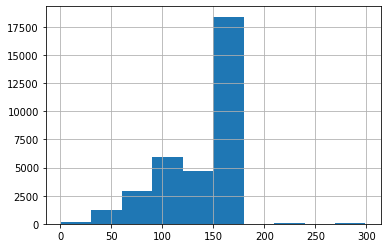

In [454]:
# Distributions are very much alike, is this because slot_end time actually set up based on order receive time?

test = round((df[df['SLA_Type'] == '1hr'].SLOT_END_TS - df[df['SLA_Type'] == '1hr'].SRC_ORDER_RCV_TS).dt.total_seconds()/60)
test[(test > 0) & (test < 300)].hist();

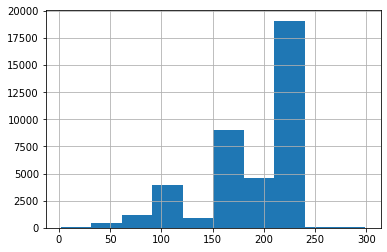

In [453]:
test = round((df[df['SLA_Type'] == '2hrs'].SLOT_END_TS - df[df['SLA_Type'] == '2hrs'].SRC_ORDER_RCV_TS).dt.total_seconds()/60)
test[(test > 0) & (test < 300)].hist();

In [244]:
# Statistical test to see if two data sets have significant difference
# Some follow normal distribution, can use t-test, some not, use mannwhitenyu test.
def mannwhitneyu_test(df1, df2, test_col, alpha=0.05):
    '''Perform Mann-Whiteny U test on @test_col of @df1 and @df2, with significant level @alpha'''
    sample1 = df1[test_col].dropna()
    sample2 = df2[test_col].dropna()
    # Perform Mann-Whitney U test
    print(f"Mann-Whitney U test on [{test_col}]:")
    stat, p_value = mannwhitneyu(sample1, sample2)
    
    # Interpret the result
    if p_value < alpha:
        print("Reject the null hypothesis: There is a significant difference between the distributions.")
    else:
        print("Fail to reject the null hypothesis: There is no significant difference between the distributions.")
    return stat, p_value

def t_test(df1, df2, test_col, alpha=0.05):
    '''Perform T-test on @test_col of @df1 and @df2, with significant level @alpha'''
    sample1 = df1[test_col].dropna()
    sample2 = df2[test_col].dropna()
    # Perform t test
    print(f"T-test on [{test_col}]:")
    stat, p_value = ttest_ind(sample1, sample2)
    
    # Interpret the result
    if p_value < alpha:
        print("Reject the null hypothesis: There is a significant difference between the distributions.")
    else:
        print("Fail to reject the null hypothesis: There is no significant difference between the distributions.")
    return stat, p_value

In [245]:
def test_multiple_cols(df1, df2, test_cols, test_method, alpha=0.05):
    ''' 
    Peform statistical tests on multiple cols
    Args:
        df1(DataFrame): sample data 1
        df2(DataFrame): sample data 2
        test_cols(list): list of column names to be tested
        test_method(str): statistical test to use, accepted values:
        - 'mann': Mann Whiteny U Test
        - 't': T-test
        alpha(float): significant level, default as 0.05
    Returns:
        stats(list): A list of test stats
        p_values(list): A list of p_values of the tests
    '''
    stats = []
    p_values = []
    for test_col in test_cols:
        if test_method == 'mann':
            stat, p_value = mannwhitneyu_test(df1, df2, test_col, alpha)
        elif test_method == 't':
            stat, p_value = t_test(df1, df2, test_col, alpha)
        else:
            print("Please input correct argument for @test_method")
            break
        stats.append(stat)
        p_values.append(p_value)
    return stats, p_values

In [247]:
mannwhitneyu_test_cols = ['tm_slot_start_driver_assgn',
                          'tm_driver_assgn_enroute_to_store',
                          'tm_drive_to_store',
                          'tm_at_store']

test_multiple_cols(df[df['SLA_Type'] == '1hr'],
                               df[df['SLA_Type'] == '2hrs'],
                               mannwhitneyu_test_cols, 'mann')

Mann-Whitney U test on [tm_slot_start_driver_assgn]:
Reject the null hypothesis: There is a significant difference between the distributions.
Mann-Whitney U test on [tm_driver_assgn_enroute_to_store]:
Reject the null hypothesis: There is a significant difference between the distributions.
Mann-Whitney U test on [tm_drive_to_store]:
Reject the null hypothesis: There is a significant difference between the distributions.
Mann-Whitney U test on [tm_at_store]:
Reject the null hypothesis: There is a significant difference between the distributions.


([626934904.0, 760678938.0, 674079299.5, 704507833.5],
 [1.8278052697510325e-125,
  2.626845379346922e-107,
  1.5660157577813247e-11,
  4.517785162252261e-05])

In [254]:
t_test_cols = ['tm_to_customer_addr', 'tot_lmd_time']

test_multiple_cols(df[df['SLA_Type'] == '1hr'],
                    df[df['SLA_Type'] == '2hrs'],
                    t_test_cols, 't')

T-test on [tm_to_customer_addr]:
Reject the null hypothesis: There is a significant difference between the distributions.
T-test on [tot_lmd_time]:
Reject the null hypothesis: There is a significant difference between the distributions.


([3.182851044202539, 5.580336918806399],
 [0.0014589247195789087, 2.408806385217183e-08])

Though visually similar, statistical still significant difference between two SLA Types.  
But we can still proceed with more analysis on two SLA Types considering the similarity.

#### Lateness Analysis
Based on above observation, since we provide similar delivery service, is the low OTD partially caused by over-promise?  
Check on late deliveries for 1hr SLA, 50% are within 17 minutes late, 75% within 38 minutes late.  
That means if change to a 90 mins window, at least half of late deliveries here would be ON TIME.

In [256]:
df[(df.DAAS_ON_TM_DLVR_IND == 0) & (df.SLA_Type == '1hr')]['tm_dlvr_slot_end'].describe()

count     2850.000000
mean        59.235088
std        488.403102
min          0.000000
25%          6.000000
50%         17.000000
75%         38.000000
max      14134.000000
Name: tm_dlvr_slot_end, dtype: float64

In [275]:
px.violin(df[(df.DAAS_ON_TM_DLVR_IND == 0) & (df.SLA_Type == '1hr') & (df.tm_dlvr_slot_end <= 120)], 
               y='tm_dlvr_slot_end')

In [258]:
# What if change all SLA to 90 minutes?
get_otd(df, ['SLA_Type'], 'slow_sla_otd_ind')

,SLA_Type,completed_deliveries,on_time_dlvr_cnt,OTD
0,1hr,34306,33495,0.976360
1,2hrs,40246,39307,0.976668


In [261]:
# What if push all SLA to 60 minutes?
get_otd(df, ['SLA_Type'], 'fast_sla_otd_ind')

,SLA_Type,completed_deliveries,on_time_dlvr_cnt,OTD
0,1hr,34305,31711,0.924384
1,2hrs,40246,37155,0.923197


Note 1hr SLA_Type OTD using 60 minutes slot window is slightly higher than current OTD 91.4%  
This is due to exists of less than 60 minutes deliveries (243 deliveries)

In [276]:
df[df['SLA_Type'] == '1hr'].groupby(['DAAS_ON_TM_DLVR_IND','fast_sla_otd_ind']).DLVR_TASK_ID.nunique()

DAAS_ON_TM_DLVR_IND  fast_sla_otd_ind
0                    0                    2594
                     1                     243
1                    1                   31468
Name: DLVR_TASK_ID, dtype: int64

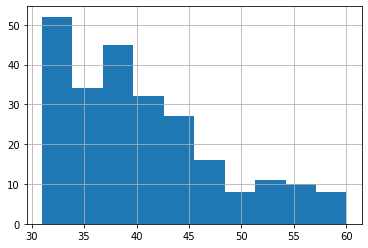

In [278]:
df[(df['DAAS_ON_TM_DLVR_IND'] == 0) & (df['fast_sla_otd_ind'] == 1)].slot_time.hist();

#### Strategy Decision on SLA
1. Try to extend some of 60 mins order to 90 mins, apparently with current network, we can deliver at almost 98% within 90 minutes.
2. Improve current network, assume drive time to customer is non-controllable, 3 components left:
    - tm_driver_assgn_enroute_to_store
    - tm_drive_to_store
    - tm_at_store  
Notice some unormal pattern in tm_driver_assgn_enroute_to_store, some driver waited 20 - 30 minutes to start trip.

#### Why some driver wait 10+ minutes to start trip?

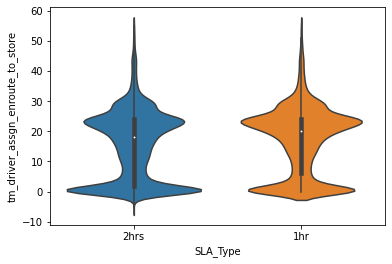

In [287]:
sns.violinplot(data=remove_outliers(df, 'tm_driver_assgn_enroute_to_store'), 
               x='SLA_Type', y='tm_driver_assgn_enroute_to_store');

In [290]:
# due to batched order?
df[df['tm_driver_assgn_enroute_to_store'] > 10]['BATCH_SIZE'].describe()

count    49893.000000
mean         1.005953
std          0.076925
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          2.000000
Name: BATCH_SIZE, dtype: float64

Is it a normal pattern? Check some other clients in golocal

In [316]:
%%bigquery test1
select 
  date_diff(DRVR_REASSGN_TS, SLOT_START_TS, minute) as tm_slot_start_driver_assgn,
  date_diff(ENRTE_TO_PCKUP_TS, DRVR_REASSGN_TS, minute) as tm_driver_assgn_enroute_to_store
from `wmt-edw-sandbox.LM_IAD_DAAS.DPS_DLMD_ALL`
where 1=1
  and lower(tenant_nm) = 'advance auto parts'
  and DLVR_CARRIER_TS is not null
  and RPT_DT between '2023-07-01' and '2023-10-31'

Downloading: 100%|█████████████████████████████████████████████████████████████████████| 139805/139805 [00:03<00:00, 40550.38rows/s]


In [312]:
def plot_violin_without_outlier(df, col, iqr_bound=1.5):
    '''Remove outliers in df[col] with @iqr_bound * IQR, and plot violin plot'''
    df_filtered = remove_outliers(df, col, iqr_bound)
    sns.violinplot(data=df_filtered, y=col)

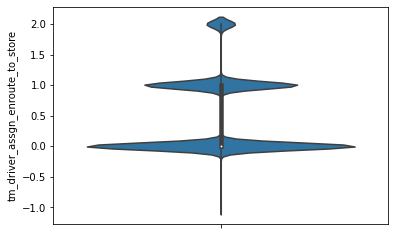

In [313]:
plot_violin_without_outlier(test1, 'tm_driver_assgn_enroute_to_store')

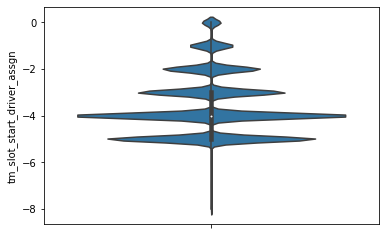

In [317]:
plot_violin_without_outlier(test1, 'tm_slot_start_driver_assgn')

In [306]:
%%bigquery test2
select
  date_diff(DRVR_REASSGN_TS, SLOT_START_TS, minute) as tm_slot_start_driver_assgn,
  date_diff(ENRTE_TO_PCKUP_TS, DRVR_REASSGN_TS, minute) as tm_driver_assgn_enroute_to_store
from `wmt-edw-sandbox.LM_IAD_DAAS.DPS_DLMD_ALL`
where 1=1
  and lower(tenant_nm) = 'the home depot'
  and DLVR_CARRIER_TS is not null
  and RPT_DT between '2023-07-01' and '2023-10-31'

Downloading: 100%|█████████████████████████████████████████████████████████████████████| 199501/199501 [00:02<00:00, 72964.62rows/s]


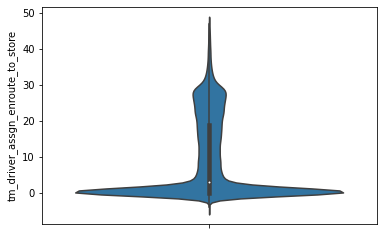

In [314]:
plot_violin_without_outlier(test2, 'tm_driver_assgn_enroute_to_store')

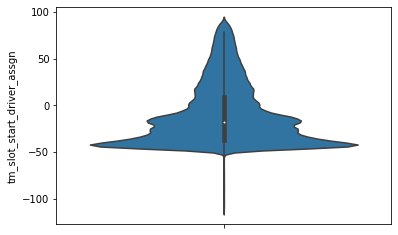

In [315]:
plot_violin_without_outlier(test2, 'tm_slot_start_driver_assgn')

In [318]:
%%bigquery test3
select
  date_diff(DRVR_REASSGN_TS, SLOT_START_TS, minute) as tm_slot_start_driver_assgn,
  date_diff(ENRTE_TO_PCKUP_TS, DRVR_REASSGN_TS, minute) as tm_driver_assgn_enroute_to_store
from `wmt-edw-sandbox.LM_IAD_DAAS.DPS_DLMD_ALL`
where 1=1
  and lower(tenant_nm) = "sam's club"
  and DLVR_CARRIER_TS is not null
  and RPT_DT between '2023-07-01' and '2023-10-31'

Downloading: 100%|██████████████████████████████████████████████████████████████████| 3158153/3158153 [00:12<00:00, 247448.35rows/s]


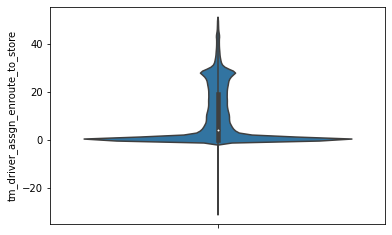

In [319]:
plot_violin_without_outlier(test3, 'tm_driver_assgn_enroute_to_store')

From AAP, Home Depot, Sam's Club, we can see it's not normal for a driver to wait more than 10 minutes to start driving to pick up  
Next, check the distance between accepting offer point to store, maybe long distance made driver hesitate?

In [322]:
long_wait = df[(df['tm_driver_assgn_enroute_to_store'] <= 30) & (df['tm_driver_assgn_enroute_to_store'] >= 20)]
short_wait = df[(df['tm_driver_assgn_enroute_to_store'] <= 5) & (df['tm_driver_assgn_enroute_to_store'] >= 0)]

In [326]:
long_wait['DIST_TO_REACH_PICKUP_POINT'].describe()

count    31692.000000
mean         1.731637
std          2.017958
min          0.000000
25%          0.482323
50%          1.287273
75%          2.431346
max         50.000000
Name: DIST_TO_REACH_PICKUP_POINT, dtype: float64

In [510]:
long_wait.tm_drive_to_store.describe()

count    31664.000000
mean         3.856841
std          8.861674
min          0.000000
25%          0.000000
50%          0.000000
75%          4.000000
max        322.000000
Name: tm_drive_to_store, dtype: float64

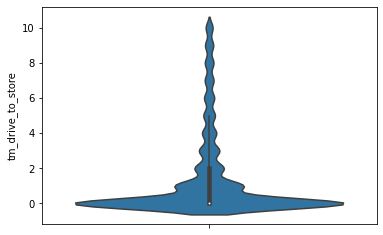

In [511]:
plot_violin_without_outlier(long_wait, 'tm_drive_to_store')

In [328]:
get_otd(long_wait, ['SLA_Type'])

,SLA_Type,completed_deliveries,on_time_dlvr_cnt,OTD
0,1hr,15863,15449,0.973902
1,2hrs,15723,15604,0.992431


In [327]:
short_wait['DIST_TO_REACH_PICKUP_POINT'].describe()

count    20775.000000
mean         3.984007
std          3.704113
min          0.000000
25%          1.410470
50%          2.967964
75%          5.667268
max         50.000000
Name: DIST_TO_REACH_PICKUP_POINT, dtype: float64

In [512]:
short_wait.tm_drive_to_store.describe()

count    20825.000000
mean        18.991405
std         14.965647
min          0.000000
25%         10.000000
50%         16.000000
75%         24.000000
max        336.000000
Name: tm_drive_to_store, dtype: float64

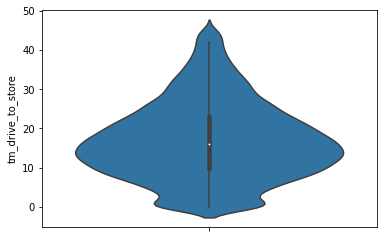

In [513]:
plot_violin_without_outlier(short_wait, 'tm_drive_to_store')

In [329]:
get_otd(short_wait, ['SLA_Type'])

,SLA_Type,completed_deliveries,on_time_dlvr_cnt,OTD
0,1hr,8355,6756,0.808618
1,2hrs,12389,11809,0.953184


Seems some drivers hit "enroute_to_pickup" and "arrived_at_pickup" almost the same time

In [525]:
px.histogram(df['tm_drive_to_store'])

In [528]:
df[df['tm_drive_to_store'] < 2].DLVR_TASK_ID.nunique() / df.DLVR_TASK_ID.nunique()

0.39786186637335513

**40%** Driver is doing this action, so time between **enroute_to_pickup** and **at_pickup** is not useable.  
We can only rely on time between **driver_assgin** to **at_pickup** to estimate drive time to store. (**tm_to_store**)

In [529]:
px.histogram(df['tm_to_store'])

In [8]:
time_cols = ['tm_slot_start_driver_assgn',
 'tm_to_store',
 'tm_at_store',
 'tm_to_customer_addr',
 'tot_lmd_time',
 'tm_dlvr_slot_start']

In [11]:
compare_performance(df, 'SLA_Type', time_cols)

Mean:


,tm_slot_start_driver_assgn,tm_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
SLA_Type,,,,,,
1hr,31.34250,27.202256,6.779259,20.741313,58.37467,27.032170
2hrs,28.56077,25.696339,6.886081,18.938744,54.00235,25.477143


Median:


,tm_slot_start_driver_assgn,tm_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
SLA_Type,,,,,,
1hr,38.0,24.0,5.0,18.0,52.0,18
2hrs,36.0,24.0,5.0,17.0,50.0,18


90% quantile:


,tm_slot_start_driver_assgn,tm_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
SLA_Type,,,,,,
1hr,45.0,42.0,12.0,30.0,78.0,53.0
2hrs,45.0,41.0,12.0,28.0,75.0,53.0


(          tm_slot_start_driver_assgn  tm_to_store  tm_at_store  \
 SLA_Type                                                         
 1hr                         31.34250    27.202256     6.779259   
 2hrs                        28.56077    25.696339     6.886081   
 
           tm_to_customer_addr  tot_lmd_time  tm_dlvr_slot_start  
 SLA_Type                                                         
 1hr                 20.741313      58.37467           27.032170  
 2hrs                18.938744      54.00235           25.477143  ,
           tm_slot_start_driver_assgn  tm_to_store  tm_at_store  \
 SLA_Type                                                         
 1hr                             38.0         24.0          5.0   
 2hrs                            36.0         24.0          5.0   
 
           tm_to_customer_addr  tot_lmd_time  tm_dlvr_slot_start  
 SLA_Type                                                         
 1hr                      18.0          52.0             

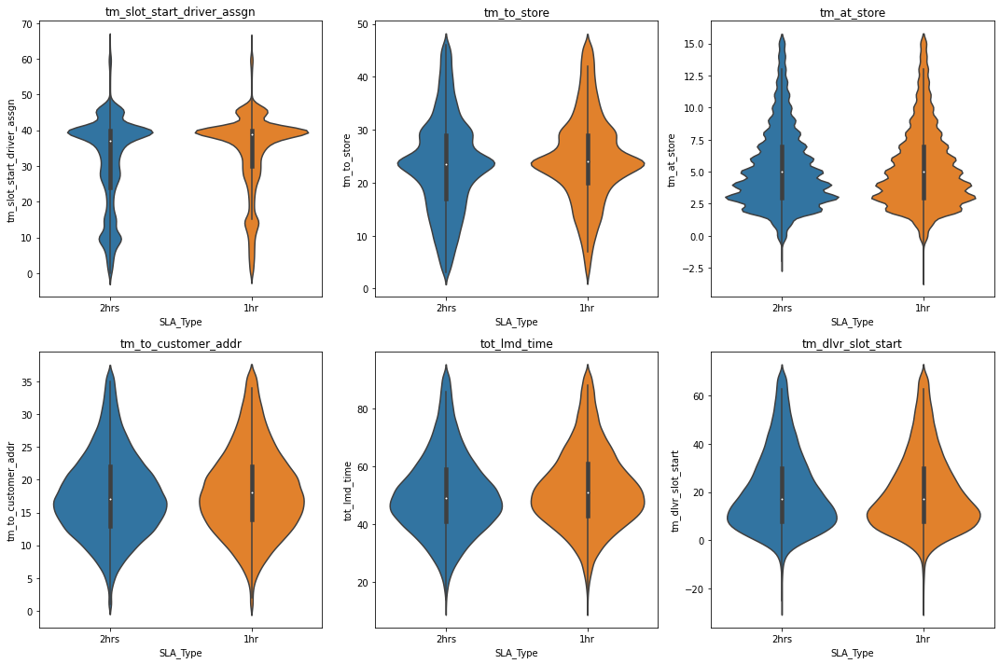

In [14]:
plot_violins(df, 'SLA_Type', time_cols)

Actually driver waited long because they hit "enroute_to_pickup" almost at the same time as "arrived_at_store"
This also reflects on OTD, though drivers waited long, OTD is very high.  
That'll lead to **distance** analysis:

In [333]:
df['DIST_TO_REACH_PICKUP_POINT_BIN'] = pd.cut(df['DIST_TO_REACH_PICKUP_POINT'], bins=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10])

In [356]:
dist_to_store_otd = get_otd(df, ['DIST_TO_REACH_PICKUP_POINT_BIN'])
dist_to_store_otd['dist_to_store'] = dist_to_store_otd.DIST_TO_REACH_PICKUP_POINT_BIN.astype(str)
dist_to_store_otd['OTD_text'] = round(dist_to_store_otd.OTD * 100, 1) 

In [362]:
px.bar(dist_to_store_otd, x='dist_to_store', y='completed_deliveries')

In [360]:
px.line(dist_to_store_otd, x='dist_to_store', y='OTD', text='OTD_text')

In [372]:
compare_performance(df, 'DIST_TO_REACH_PICKUP_POINT_BIN', time_cols)

Mean:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
DIST_TO_REACH_PICKUP_POINT_BIN,,,,,,,
"(0, 1]",-33.297260,19.853128,5.143556,7.059364,20.260074,55.511842,22.214582
"(1, 2]",-31.449752,18.574484,6.967147,6.137894,19.494313,54.623788,23.186591
"(2, 3]",-28.607170,16.060003,9.503626,6.782569,19.132860,53.796889,25.189720
"(3, 4]",-29.631299,15.421839,11.056411,6.480714,19.697624,55.270352,25.639052
"(4, 5]",-27.514139,12.978889,14.066557,6.551171,19.578373,55.532377,28.018238
"(5, 6]",-24.912834,10.339343,18.676015,7.117021,20.149273,59.137022,34.224188
"(6, 7]",-24.087279,9.186804,20.220066,10.989265,19.277363,62.718403,38.631124
"(7, 8]",-22.519126,7.712432,23.857826,6.369610,20.156228,60.913251,38.394126
"(8, 9]",-17.359375,6.217448,26.638853,7.558747,20.075916,62.596354,45.236979


Median:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
DIST_TO_REACH_PICKUP_POINT_BIN,,,,,,,
"(0, 1]",-40.0,23.0,1.0,5.0,17.0,50.0,14.0
"(1, 2]",-38.0,21.0,3.0,5.0,18.0,50.0,16.0
"(2, 3]",-36.0,18.0,7.0,5.0,18.0,50.0,18.0
"(3, 4]",-36.0,17.0,9.0,5.0,18.0,51.0,19.0
"(4, 5]",-33.0,12.0,14.0,5.0,18.0,51.0,22.0
"(5, 6]",-29.0,5.0,18.0,5.0,19.0,53.0,27.0
"(6, 7]",-28.0,2.0,20.0,5.0,18.0,53.0,28.0
"(7, 8]",-27.0,1.0,22.0,5.0,18.0,55.0,31.0
"(8, 9]",-22.0,1.0,25.0,6.0,18.0,57.0,38.5


90% quantile:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
DIST_TO_REACH_PICKUP_POINT_BIN,,,,,,,
"(0, 1]",-10.0,30.0,15.0,13.0,29.0,74.0,43.0
"(1, 2]",-9.0,30.0,17.0,11.0,29.0,73.0,47.0
"(2, 3]",-6.0,29.0,22.0,12.0,29.0,74.0,53.0
"(3, 4]",-8.0,28.0,25.0,12.0,30.0,76.0,52.0
"(4, 5]",-5.0,28.0,29.0,12.0,29.0,77.0,57.0
"(5, 6]",-3.0,26.0,34.0,12.0,30.0,82.0,66.0
"(6, 7]",-2.0,26.0,36.0,12.0,29.0,81.2,66.0
"(7, 8]",-1.0,24.0,41.0,11.0,30.0,85.0,70.0
"(8, 9]",5.0,21.0,44.0,13.0,29.0,87.0,77.3


In [374]:
dist_to_store_sla_otd = get_otd(df, ['DIST_TO_REACH_PICKUP_POINT_BIN', 'SLA_Type'])
dist_to_store_sla_otd['dist_to_store'] = dist_to_store_sla_otd.DIST_TO_REACH_PICKUP_POINT_BIN.astype(str)
dist_to_store_sla_otd['OTD_text'] = round(dist_to_store_sla_otd.OTD * 100, 1) 

In [377]:
px.line(dist_to_store_sla_otd, x='dist_to_store', y='OTD', color='SLA_Type', text='OTD_text')

If we want to push to 60 minutes delivery, driver supply within 2 miles, even 1 mile, would be critical to success.

#### OTD Decline during the day
Another patter in local slot hour is OTD declines across the day.  
Initial guess is related to traffic, validate: distance vs time

In [379]:
df['drive_speed_to_store'] = df['DIST_TO_REACH_PICKUP_POINT'] / (df['tm_drive_to_store'] / 60)

In [401]:
df_mean, df_median, df_p90 = compare_performance(df, 'LOCAL_SLOT_HOUR', 
                                                 ['DIST_TO_REACH_PICKUP_POINT', 
                                                  'tm_drive_to_store',
                                                 'tm_driver_search'])

Mean:


,DIST_TO_REACH_PICKUP_POINT,tm_drive_to_store,tm_driver_search
LOCAL_SLOT_HOUR,,,
9,4.504388,20.684316,6.205144
10,2.671927,8.862542,5.512559
11,2.543315,9.361030,5.172915
12,2.205248,9.285083,4.641378
13,2.186831,9.022141,4.563895
14,2.274442,9.571715,4.773961
15,2.617501,10.540969,6.117974
16,2.761507,11.455385,7.009602
17,2.889031,11.514003,7.830212


Median:


,DIST_TO_REACH_PICKUP_POINT,tm_drive_to_store,tm_driver_search
LOCAL_SLOT_HOUR,,,
9,3.794618,18.0,2.013367
10,1.910491,3.0,2.066350
11,1.790097,4.0,1.688050
12,1.546692,4.0,1.562225
13,1.513514,4.0,1.541925
14,1.583910,5.0,1.601750
15,1.877295,6.0,1.913492
16,1.939583,7.0,2.382133
17,2.045892,7.0,2.775142


90% quantile:


,DIST_TO_REACH_PICKUP_POINT,tm_drive_to_store,tm_driver_search
LOCAL_SLOT_HOUR,,,
9,8.826857,46.0,15.438012
10,5.889978,24.0,14.506353
11,5.705348,25.0,13.736917
12,5.039559,24.0,12.843148
13,5.027351,24.0,12.662425
14,5.130875,25.0,13.015087
15,5.776630,27.0,15.943813
16,6.132421,28.0,20.284650
17,6.388468,29.0,23.063917


In [389]:
# Too many categories, messy with violin plots, plot only median and 90% percentile
y1 = df_mean['DIST_TO_REACH_PICKUP_POINT']
y2 = df_mean['tm_drive_to_store']
px.line(df_mean, y=[y1, y2])

In [402]:
compare_performance(df, 'LOCAL_SLOT_HOUR', time_cols)

Mean:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
LOCAL_SLOT_HOUR,,,,,,,
9,-30.434263,12.751745,20.684316,4.954955,18.127127,61.415339,30.981076
10,-32.809268,17.748722,8.862542,6.440978,18.428020,53.963612,21.154344
11,-29.006049,16.247731,9.361030,6.929439,18.808106,53.660870,24.654820
12,-30.144820,17.159839,9.285083,6.693512,18.756169,55.524704,25.533585
13,-30.517967,17.339640,9.022141,6.698779,18.625461,54.147754,23.629787
14,-28.960330,16.439856,9.571715,8.309193,19.321386,56.255458,27.295128
15,-27.889271,15.704127,10.540969,6.645523,20.072864,55.965382,28.076111
16,-27.032890,15.149920,11.455385,6.848161,24.883314,63.453589,36.425314
17,-27.620061,14.755537,11.514003,6.735420,22.396882,58.574251,30.983143


Median:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
LOCAL_SLOT_HOUR,,,,,,,
9,-37.0,9.0,18.0,4.0,17.0,54.0,21
10,-38.0,20.0,3.0,5.0,17.0,50.0,15
11,-37.0,19.0,4.0,5.0,17.0,50.0,17
12,-38.0,20.0,4.0,5.0,17.0,50.0,17
13,-38.0,20.0,4.0,5.0,17.0,50.0,17
14,-37.0,19.0,5.0,5.0,18.0,50.0,19
15,-36.0,18.0,6.0,5.0,18.0,51.0,20
16,-35.0,17.0,7.0,5.0,19.0,52.0,22
17,-35.0,17.0,7.0,5.0,20.0,53.0,23


90% quantile:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
LOCAL_SLOT_HOUR,,,,,,,
9,-11.3,28.0,46.0,8.0,29.0,84.0,60.7
10,-15.0,29.0,24.0,11.0,27.0,74.0,44.1
11,-7.0,29.0,25.0,12.0,28.0,74.0,51.0
12,-8.0,30.0,24.0,12.0,28.0,76.0,52.0
13,-9.0,29.0,24.0,12.0,28.0,74.1,50.0
14,-7.0,29.0,25.0,12.0,29.0,76.0,54.0
15,-4.0,29.0,27.0,12.0,30.0,78.0,59.0
16,-2.0,29.0,28.0,12.0,32.0,80.0,63.0
17,-4.0,29.0,29.0,12.0,33.0,81.0,60.0


(                 tm_slot_start_driver_assgn  tm_driver_assgn_enroute_to_store  \
 LOCAL_SLOT_HOUR                                                                 
 9                                -30.434263                         12.751745   
 10                               -32.809268                         17.748722   
 11                               -29.006049                         16.247731   
 12                               -30.144820                         17.159839   
 13                               -30.517967                         17.339640   
 14                               -28.960330                         16.439856   
 15                               -27.889271                         15.704127   
 16                               -27.032890                         15.149920   
 17                               -27.620061                         14.755537   
 18                               -28.511194                         15.738562   
 19             

In [424]:
dlvr_cnt = df.groupby(['DRVR_USER_ID', 'EXT_STORE_NBR']).DLVR_TASK_ID.nunique().reset_index()
dlvr_cnt.rename(columns={'DLVR_TASK_ID':'drvr_store_dlvr_cnt'}, inplace=True)
df = df.merge(dlvr_cnt, on=['DRVR_USER_ID', 'EXT_STORE_NBR'], how='left')

In [426]:
get_otd(df[df['drvr_store_seq_nbr'] <= 20], ['drvr_store_seq_nbr', 'drvr_store_dlvr_cnt']).to_clipboard()

In [428]:
df.groupby('RPT_DT').DLVR_TASK_ID.nunique().to_clipboard()

In [416]:
get_otd(df[df['drvr_store_seq_nbr'] <= 20], ['SLA_Type', 'drvr_store_seq_nbr'])

,SLA_Type,drvr_store_seq_nbr,completed_deliveries,on_time_dlvr_cnt,OTD
0,1hr,1,9793,8730,0.891453
1,1hr,2,4909,4473,0.911184
2,1hr,3,3257,2993,0.918944
3,1hr,4,2345,2167,0.924094
4,1hr,5,1781,1645,0.923638
5,1hr,6,1429,1317,0.921624
6,1hr,7,1167,1074,0.920308
7,1hr,8,958,896,0.935282
8,1hr,9,789,728,0.922687
9,1hr,10,701,657,0.937233


In [413]:
compare_performance(df[df['drvr_store_seq_nbr'] <= 20], 'drvr_store_seq_nbr', ['tm_driver_search', 'tm_drive_to_store', 'tot_lmd_time'])

Mean:


,tm_driver_search,tm_drive_to_store,tot_lmd_time
drvr_store_seq_nbr,,,
1,6.874392,11.984120,58.176150
2,6.232069,10.376463,57.785548
3,5.914238,10.181544,57.700086
4,5.725093,9.343612,54.805511
5,5.754580,8.898608,54.618998
6,5.123023,9.041749,54.201444
7,4.961202,8.820265,54.337881
8,4.861218,8.570053,53.559233
9,5.044108,8.935539,53.047863


Median:


,tm_driver_search,tm_drive_to_store,tot_lmd_time
drvr_store_seq_nbr,,,
1,2.800000,8.0,52.0
2,2.509783,6.0,51.0
3,2.185683,5.0,50.0
4,1.875217,4.0,50.0
5,1.894017,3.0,50.0
6,1.680342,3.0,49.0
7,1.568750,3.0,50.0
8,1.568558,3.0,50.0
9,1.591817,4.0,50.0


90% quantile:


,tm_driver_search,tm_drive_to_store,tot_lmd_time
drvr_store_seq_nbr,,,
1,17.042135,29.0,79.0
2,15.772793,26.0,76.0
3,15.391463,26.0,77.0
4,14.930625,25.0,76.0
5,14.852417,24.0,75.0
6,13.353802,25.0,75.0
7,13.418033,24.0,76.0
8,13.195228,23.0,73.0
9,13.284857,23.0,72.0


(                    tm_driver_search  tm_drive_to_store  tot_lmd_time
 drvr_store_seq_nbr                                                   
 1                           6.874392          11.984120     58.176150
 2                           6.232069          10.376463     57.785548
 3                           5.914238          10.181544     57.700086
 4                           5.725093           9.343612     54.805511
 5                           5.754580           8.898608     54.618998
 6                           5.123023           9.041749     54.201444
 7                           4.961202           8.820265     54.337881
 8                           4.861218           8.570053     53.559233
 9                           5.044108           8.935539     53.047863
 10                          4.516951           7.940785     53.344186
 11                          4.668807           7.954858     52.973242
 12                          4.446601           8.188482     52.027875
 13   

In [414]:
compare_performance(df[df['drvr_store_seq_nbr'] <= 20], 'drvr_store_seq_nbr', time_cols)

Mean:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
drvr_store_seq_nbr,,,,,,,
1,-28.853993,15.744943,11.984120,6.744107,20.045306,58.176150,29.385611
2,-29.372328,16.292134,10.376463,7.399869,20.754669,57.785548,28.413220
3,-29.600545,16.431874,10.181544,6.301784,21.777345,57.700086,28.105263
4,-29.851038,16.874551,9.343612,6.327389,19.293504,54.805511,24.954473
5,-29.657308,16.936500,8.898608,6.271151,19.032139,54.618998,24.961690
6,-29.818570,16.763624,9.041749,7.273355,18.949208,54.201444,24.382874
7,-30.350722,17.112761,8.820265,6.455936,19.575916,54.337881,23.987159
8,-30.605755,16.964921,8.570053,6.330925,19.125483,53.559233,22.953477
9,-30.087749,16.415051,8.935539,6.641757,18.905606,53.047863,22.960114


Median:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
drvr_store_seq_nbr,,,,,,,
1,-36.0,17.0,8.0,5.0,18.0,52.0,20.0
2,-36.0,18.0,6.0,5.0,18.0,51.0,19.0
3,-37.0,19.0,5.0,5.0,18.0,50.0,18.0
4,-37.0,20.0,4.0,5.0,18.0,50.0,17.0
5,-37.0,19.0,3.0,5.0,18.0,50.0,18.0
6,-37.0,20.0,3.0,5.0,18.0,49.0,17.0
7,-38.0,20.0,3.0,5.0,17.0,50.0,17.0
8,-38.0,20.0,3.0,5.0,18.0,50.0,16.0
9,-38.0,20.0,4.0,5.0,17.0,50.0,16.0


90% quantile:


,tm_slot_start_driver_assgn,tm_driver_assgn_enroute_to_store,tm_drive_to_store,tm_at_store,tm_to_customer_addr,tot_lmd_time,tm_dlvr_slot_start
drvr_store_seq_nbr,,,,,,,
1,-5.0,30.0,29.0,12.0,29.0,79.0,59.0
2,-7.0,30.0,26.0,11.0,29.0,76.0,54.0
3,-8.0,30.0,26.0,11.0,29.0,77.0,54.0
4,-8.0,29.0,25.0,11.0,30.0,76.0,53.0
5,-7.0,30.0,24.0,11.0,28.0,75.0,51.0
6,-8.0,29.0,25.0,11.0,29.0,75.0,52.0
7,-9.1,29.0,24.0,11.0,29.0,76.0,51.9
8,-9.0,29.0,23.0,11.0,29.0,73.0,50.0
9,-9.4,28.0,23.0,12.0,28.0,72.0,51.0


(                    tm_slot_start_driver_assgn  \
 drvr_store_seq_nbr                               
 1                                   -28.853993   
 2                                   -29.372328   
 3                                   -29.600545   
 4                                   -29.851038   
 5                                   -29.657308   
 6                                   -29.818570   
 7                                   -30.350722   
 8                                   -30.605755   
 9                                   -30.087749   
 10                                  -30.795349   
 11                                  -30.861621   
 12                                  -30.731707   
 13                                  -30.702970   
 14                                  -30.426991   
 15                                  -30.736520   
 16                                  -30.238227   
 17                                  -30.231951   
 18                            

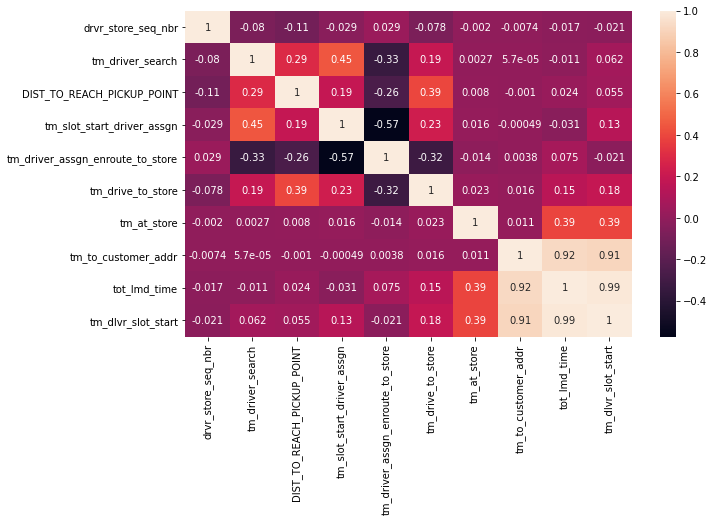

In [434]:
plt.figure(figsize=(10, 6))
sns.heatmap(df[df['drvr_store_seq_nbr'] <= 20][['drvr_store_seq_nbr'] + ['tm_driver_search', 'DIST_TO_REACH_PICKUP_POINT'] + time_cols].corr(), annot=True);

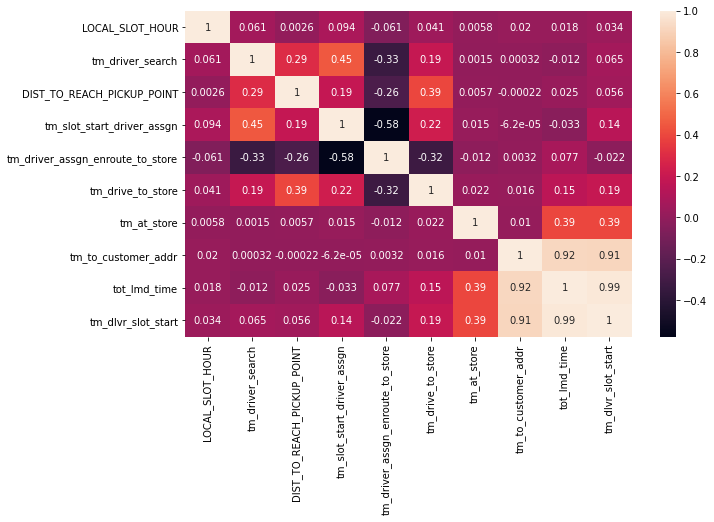

In [435]:
plt.figure(figsize=(10, 6))
sns.heatmap(df[['LOCAL_SLOT_HOUR'] + ['tm_driver_search', 'DIST_TO_REACH_PICKUP_POINT'] + time_cols].corr(), annot=True);

In [445]:
compare_performance(df[(df['drvr_store_dlvr_cnt'] >= 5) & (df['drvr_store_seq_nbr'] < 20)],
                    'drvr_store_seq_nbr',['DIST_TO_REACH_PICKUP_POINT', 'tm_drive_to_store'])

Mean:


,DIST_TO_REACH_PICKUP_POINT,tm_drive_to_store
drvr_store_seq_nbr,,
1,2.580764,10.038176
2,2.480048,9.109024
3,2.468465,9.579101
4,2.473999,9.168519
5,2.503866,8.896543
6,2.362207,9.046053
7,2.269448,8.820265
8,2.305453,8.570053
9,2.281368,8.935539


Median:


,DIST_TO_REACH_PICKUP_POINT,tm_drive_to_store
drvr_store_seq_nbr,,
1,1.915242,5.0
2,1.813897,4.0
3,1.793841,3.0
4,1.797501,3.0
5,1.798887,3.0
6,1.726193,3.0
7,1.632501,3.0
8,1.664329,3.0
9,1.666448,4.0


90% quantile:


,DIST_TO_REACH_PICKUP_POINT,tm_drive_to_store
drvr_store_seq_nbr,,
1,5.368914,26.0
2,5.193004,24.0
3,5.294324,25.0
4,5.306347,24.0
5,5.506881,24.0
6,5.124245,25.0
7,5.137266,24.0
8,4.977222,23.0
9,5.211403,23.0


(                    DIST_TO_REACH_PICKUP_POINT  tm_drive_to_store
 drvr_store_seq_nbr                                               
 1                                     2.580764          10.038176
 2                                     2.480048           9.109024
 3                                     2.468465           9.579101
 4                                     2.473999           9.168519
 5                                     2.503866           8.896543
 6                                     2.362207           9.046053
 7                                     2.269448           8.820265
 8                                     2.305453           8.570053
 9                                     2.281368           8.935539
 10                                    2.322885           7.940785
 11                                    2.046411           7.954858
 12                                    2.098615           8.188482
 13                                    2.245184           8.42

In [451]:
compare_performance(df, 'DAAS_ON_TM_DLVR_IND', 'tm_at_store')

Mean:


DAAS_ON_TM_DLVR_IND
0    18.179361
1     6.220873
Name: tm_at_store, dtype: float64

Median:


DAAS_ON_TM_DLVR_IND
0    6.0
1    5.0
Name: tm_at_store, dtype: float64

90% quantile:


DAAS_ON_TM_DLVR_IND
0    31.0
1    11.0
Name: tm_at_store, dtype: float64

(DAAS_ON_TM_DLVR_IND
 0    18.179361
 1     6.220873
 Name: tm_at_store, dtype: float64,
 DAAS_ON_TM_DLVR_IND
 0    6.0
 1    5.0
 Name: tm_at_store, dtype: float64,
 DAAS_ON_TM_DLVR_IND
 0    31.0
 1    11.0
 Name: tm_at_store, dtype: float64)

In [456]:
compare_performance(df, 'DAAS_ON_TM_DLVR_IND', 'DWT')

Mean:


DAAS_ON_TM_DLVR_IND
0    14.169448
1     5.146930
Name: DWT, dtype: float64

Median:


DAAS_ON_TM_DLVR_IND
0    5.333333
1    4.083333
Name: DWT, dtype: float64

90% quantile:


DAAS_ON_TM_DLVR_IND
0    17.583333
1     9.233333
Name: DWT, dtype: float64

(DAAS_ON_TM_DLVR_IND
 0    14.169448
 1     5.146930
 Name: DWT, dtype: float64,
 DAAS_ON_TM_DLVR_IND
 0    5.333333
 1    4.083333
 Name: DWT, dtype: float64,
 DAAS_ON_TM_DLVR_IND
 0    17.583333
 1     9.233333
 Name: DWT, dtype: float64)

#### How to get 99.5%?
Focus on one factor: **tm_to_store**  
Assumption: other times stay the same
1. Calculate time needed to improve to deliver on time.
2. Set up a lower bound for **tm_to_store** as the best which delivery can acheive, p25 is 18 minutes, set it as 15 minutes.
3. Calculate with those improvements, what's the best OTD we can acheive.

In [471]:
def more_ot_dlvr_needed(df, otd_goal=.995):
    ''' Returns how many more on-time delivery needed to achieve @otd_goal.'''
    tot_dlvr = df.DLVR_TASK_ID.nunique()
    ot_dlvr_needed = round(tot_dlvr * otd_goal, 0)
    current_ot_dlvr = df[df['DAAS_ON_TM_DLVR_IND'] == 1].DLVR_TASK_ID.nunique()
    return ot_dlvr_needed - current_ot_dlvr

In [472]:
more_ot_dlvr_needed(df)

3497.0

In [540]:
def more_ot_dlvr_needed(df, tm_to_store_lower_bound=15):
    ''' Returns number of deliveries can be improved, and improved OTD, based on input lowerbound of tm_to_store.'''
    df['time_to_improve'] = df['tm_dlvr_slot_end'].apply(lambda x: 0 if x <= 0 else x)
    df['improve_ind'] = 1 * (df['tm_to_store'] - df['time_to_improve'] >= tm_to_store_lower_bound)
    num_dlvr_can_improve = df[(df['DAAS_ON_TM_DLVR_IND'] == 0) & (df['improve_ind'] == 1)].DLVR_TASK_ID.nunique()
    
    tot_dlvr = df.DLVR_TASK_ID.nunique()
    current_ot_dlvr = df[df['DAAS_ON_TM_DLVR_IND'] == 1].DLVR_TASK_ID.nunique()
    improved_otd = (current_ot_dlvr + num_dlvr_can_improve) / tot_dlvr
    return num_dlvr_can_improve, improved_otd

In [541]:
more_ot_dlvr_needed(df)

(2112, 0.9764188273799144)

In [542]:
more_ot_dlvr_needed(df, 10)

(2369, 0.9798661319096994)

In [37]:
df[['tm_to_store', 'DIST_TO_REACH_PICKUP_POINT', 'DAAS_ON_TM_DLVR_IND', 'tm_driver_search']].corr()

,tm_to_store,DIST_TO_REACH_PICKUP_POINT,DAAS_ON_TM_DLVR_IND,tm_driver_search
tm_to_store,1.000000,0.151951,-0.308622,-0.092680
DIST_TO_REACH_PICKUP_POINT,0.151951,1.000000,-0.137434,0.292082
DAAS_ON_TM_DLVR_IND,-0.308622,-0.137434,1.000000,-0.152319
tm_driver_search,-0.092680,0.292082,-0.152319,1.000000


In [41]:
compare_performance(df, 'DAAS_ON_TM_DLVR_IND', ['tm_driver_search',
                                               'tm_slot_start_driver_assgn',
                                               'tm_to_store',
                                               'DIST_TO_REACH_PICKUP_POINT',
                                               'tm_at_store'])

Mean:


,tm_driver_search,tm_slot_start_driver_assgn,tm_to_store,DIST_TO_REACH_PICKUP_POINT,tm_at_store
DAAS_ON_TM_DLVR_IND,,,,,
0,12.058037,1.470134,47.597312,4.257112,18.179361
1,5.281542,31.392891,25.231596,2.467324,6.220873


Median:


,tm_driver_search,tm_slot_start_driver_assgn,tm_to_store,DIST_TO_REACH_PICKUP_POINT,tm_at_store
DAAS_ON_TM_DLVR_IND,,,,,
0,2.415358,9.0,37.0,2.788050,6.0
1,1.780817,38.0,24.0,1.771398,5.0


90% quantile:


,tm_driver_search,tm_slot_start_driver_assgn,tm_to_store,DIST_TO_REACH_PICKUP_POINT,tm_at_store
DAAS_ON_TM_DLVR_IND,,,,,
0,39.649197,40.0,93.0,9.853506,31.0
1,14.120810,45.0,39.0,5.498477,11.0


(                     tm_driver_search  tm_slot_start_driver_assgn  \
 DAAS_ON_TM_DLVR_IND                                                 
 0                           12.058037                    1.470134   
 1                            5.281542                   31.392891   
 
                      tm_to_store  DIST_TO_REACH_PICKUP_POINT  tm_at_store  
 DAAS_ON_TM_DLVR_IND                                                        
 0                      47.597312                    4.257112    18.179361  
 1                      25.231596                    2.467324     6.220873  ,
                      tm_driver_search  tm_slot_start_driver_assgn  \
 DAAS_ON_TM_DLVR_IND                                                 
 0                            2.415358                         9.0   
 1                            1.780817                        38.0   
 
                      tm_to_store  DIST_TO_REACH_PICKUP_POINT  tm_at_store  
 DAAS_ON_TM_DLVR_IND                              

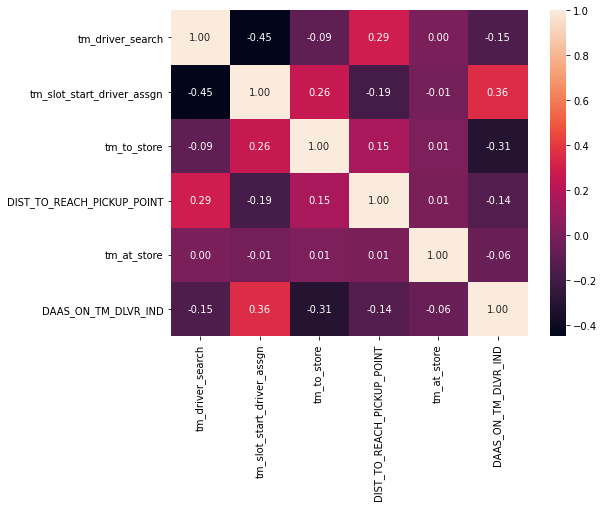

In [39]:
plt.figure(figsize=(8,6))
sns.heatmap(df[['tm_driver_search',
                'tm_slot_start_driver_assgn',
                'tm_to_store',
                'DIST_TO_REACH_PICKUP_POINT',
                'tm_at_store', 
                'DAAS_ON_TM_DLVR_IND']].corr(), annot=True, fmt=".2f");

In [24]:
px.violin(df[df['DAAS_ON_TM_DLVR_IND'] == 0], )

In [25]:
px.box(df, 'tm_driver_search')